In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import mysql.connector
from tabulate import tabulate 

In [2]:
df = pd.read_csv(r"C:\Users\krupa\OneDrive\Desktop\practice\dataset\stock\stock_data.csv")
df

,dt,vix,sp500,sp500_volume,djia,djia_volume,hsi,ads,us3m,joblessness,epu,GPRD,prev_day
0,1990-01-03,18.19,358.760010,1.923300e+08,2809.73,23.62,2858.699951,-0.229917,7.89,3,100.359178,75.408051,359.690002
1,1990-01-04,19.22,355.670013,1.770000e+08,2796.08,24.37,2868.000000,-0.246065,7.84,3,100.359178,56.085804,358.760010
2,1990-01-05,20.11,352.200012,1.585300e+08,2773.25,20.29,2839.899902,-0.260393,7.79,3,100.359178,63.847675,355.670013
3,1990-01-08,20.26,353.790009,1.401100e+08,2794.37,16.61,2816.000000,-0.291750,7.79,3,100.359178,102.841156,352.200012
4,1990-01-09,22.20,349.619995,1.552100e+08,2766.00,15.80,2822.000000,-0.297326,7.80,3,100.359178,138.435669,353.790009
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8592,2024-02-12,13.93,5021.840000,3.805740e+09,38797.90,260.66,15746.580078,-0.092373,5.43,1,89.218778,156.723633,5026.610000
8593,2024-02-13,15.85,4953.170000,4.302190e+09,38272.49,305.80,15746.580078,-0.071135,5.45,1,89.218778,187.858292,5021.840000
8594,2024-02-14,14.38,5000.620000,3.845600e+09,38423.68,265.90,15879.379883,-0.052492,5.43,1,89.218778,135.809372,4953.170000
8595,2024-02-15,14.01,5029.730000,4.137970e+09,38773.12,300.35,15944.629883,-0.036436,5.43,1,89.218778,214.808151,5000.620000


In [3]:
df.columns 

Index(['dt', 'vix', 'sp500', 'sp500_volume', 'djia', 'djia_volume', 'hsi',
       'ads', 'us3m', 'joblessness', 'epu', 'GPRD', 'prev_day'],
      dtype='object')

In [4]:
df.isnull().sum()

dt              0
vix             0
sp500           0
sp500_volume    0
djia            0
djia_volume     0
hsi             0
ads             0
us3m            0
joblessness     0
epu             0
GPRD            0
prev_day        0
dtype: int64

In [5]:
conn = mysql.connector.connect(host='localhost', username='root', password='mysql', db='stock')
cursor = conn.cursor()
cursor.execute("SELECT * FROM stock.stock_data")
result = cursor.fetchall()
print(tabulate(result, headers=df.columns, tablefmt="grid")) 

+------------+-------+---------+----------------+----------+---------------+----------+---------------+--------+---------------+----------+-----------+------------+
| dt         |   vix |   sp500 |   sp500_volume |     djia |   djia_volume |      hsi |           ads |   us3m |   joblessness |      epu |      GPRD |   prev_day |
+============+=======+=========+================+==========+===============+==========+===============+========+===============+==========+===========+============+
| 1990-01-03 | 18.19 |  358.76 |    1.9233e+08  |  2809.73 |         23.62 |  2858.7  |  -0.229917    |   7.89 |             3 | 100.359  |   75.4081 |     359.69 |
+------------+-------+---------+----------------+----------+---------------+----------+---------------+--------+---------------+----------+-----------+------------+
| 1990-01-04 | 19.22 |  355.67 |    1.77e+08    |  2796.08 |         24.37 |  2868    |  -0.246065    |   7.84 |             3 | 100.359  |   56.0858 |     358.76 |
+---------

S&P 500 Trends 

+------------+---------+-------------+----------------+--------+---------------+-------+-------+--------+---------------+-----------+
| dt         |     vix |       sp500 |   sp500_volume |   djia |   djia_volume |   hsi |   ads |   us3m |   joblessness |       epu |
+============+=========+=============+================+========+===============+=======+=======+========+===============+===========+
| 1990-01-03 |  358.76 | 1.9233e+08  |        2809.73 |  23.62 |       2858.7  | 18.19 |  7.89 |      3 |      100.359  |   75.4081 |
+------------+---------+-------------+----------------+--------+---------------+-------+-------+--------+---------------+-----------+
| 1990-01-04 |  355.67 | 1.77e+08    |        2796.08 |  24.37 |       2868    | 19.22 |  7.84 |      3 |      100.359  |   56.0858 |
+------------+---------+-------------+----------------+--------+---------------+-------+-------+--------+---------------+-----------+
| 1990-01-05 |  352.2  | 1.5853e+08  |        2773.25 |  20.29

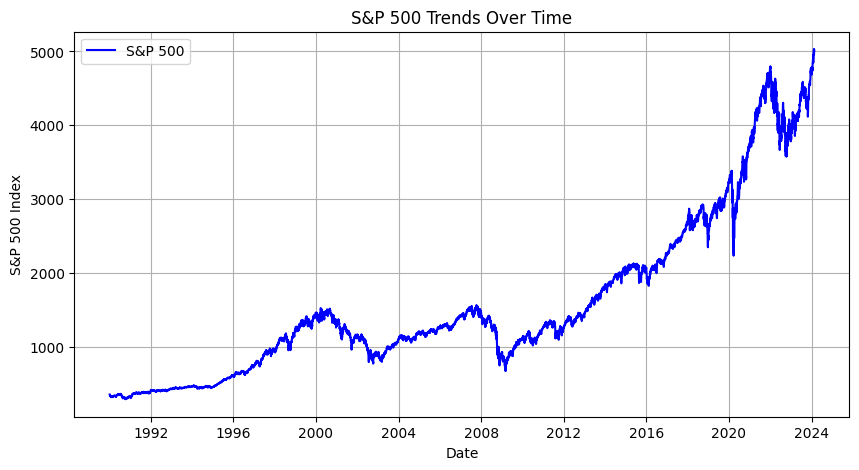

In [6]:
cursor.execute("SELECT dt, sp500, sp500_volume, djia, djia_volume, hsi, vix, us3m, joblessness, epu, GPRD FROM stock_data")
result = cursor.fetchall()
print(tabulate(result, headers=df.columns, tablefmt="grid")) 

df['dt'] = pd.to_datetime(df['dt'])
df['dt'] = df['dt'].dt.date

plt.figure(figsize=(10, 5))
plt.plot(df['dt'], df['sp500'], label='S&P 500', color='blue')
plt.title("S&P 500 Trends Over Time")
plt.xlabel("Date")
plt.ylabel("S&P 500 Index")
plt.legend()
plt.grid()
plt.show()

Volatility Index (VIX) Over Time

+------------+---------+-------------+----------------+--------+---------------+-------+-------+--------+---------------+-----------+
| dt         |     vix |       sp500 |   sp500_volume |   djia |   djia_volume |   hsi |   ads |   us3m |   joblessness |       epu |
+============+=========+=============+================+========+===============+=======+=======+========+===============+===========+
| 1990-01-03 |  358.76 | 1.9233e+08  |        2809.73 |  23.62 |       2858.7  | 18.19 |  7.89 |      3 |      100.359  |   75.4081 |
+------------+---------+-------------+----------------+--------+---------------+-------+-------+--------+---------------+-----------+
| 1990-01-04 |  355.67 | 1.77e+08    |        2796.08 |  24.37 |       2868    | 19.22 |  7.84 |      3 |      100.359  |   56.0858 |
+------------+---------+-------------+----------------+--------+---------------+-------+-------+--------+---------------+-----------+
| 1990-01-05 |  352.2  | 1.5853e+08  |        2773.25 |  20.29

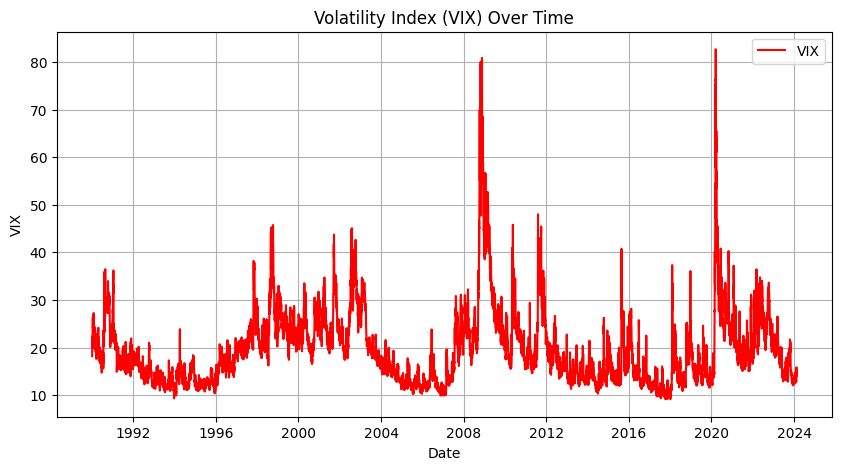

In [7]:
cursor.execute("SELECT dt, sp500, sp500_volume, djia, djia_volume, hsi, vix, us3m, joblessness, epu, GPRD FROM stock_data")
result = cursor.fetchall()
print(tabulate(result, headers=df.columns, tablefmt="grid")) 

plt.figure(figsize=(10, 5))
plt.plot(df['dt'], df['vix'], label='VIX', color='red')
plt.title("Volatility Index (VIX) Over Time")
plt.xlabel("Date")
plt.ylabel("VIX")
plt.legend()
plt.grid()
plt.show()

DJIA vs. S&P 500

+------------+---------+-------------+----------------+--------+---------------+-------+-------+--------+---------------+-----------+
| dt         |     vix |       sp500 |   sp500_volume |   djia |   djia_volume |   hsi |   ads |   us3m |   joblessness |       epu |
+============+=========+=============+================+========+===============+=======+=======+========+===============+===========+
| 1990-01-03 |  358.76 | 1.9233e+08  |        2809.73 |  23.62 |       2858.7  | 18.19 |  7.89 |      3 |      100.359  |   75.4081 |
+------------+---------+-------------+----------------+--------+---------------+-------+-------+--------+---------------+-----------+
| 1990-01-04 |  355.67 | 1.77e+08    |        2796.08 |  24.37 |       2868    | 19.22 |  7.84 |      3 |      100.359  |   56.0858 |
+------------+---------+-------------+----------------+--------+---------------+-------+-------+--------+---------------+-----------+
| 1990-01-05 |  352.2  | 1.5853e+08  |        2773.25 |  20.29

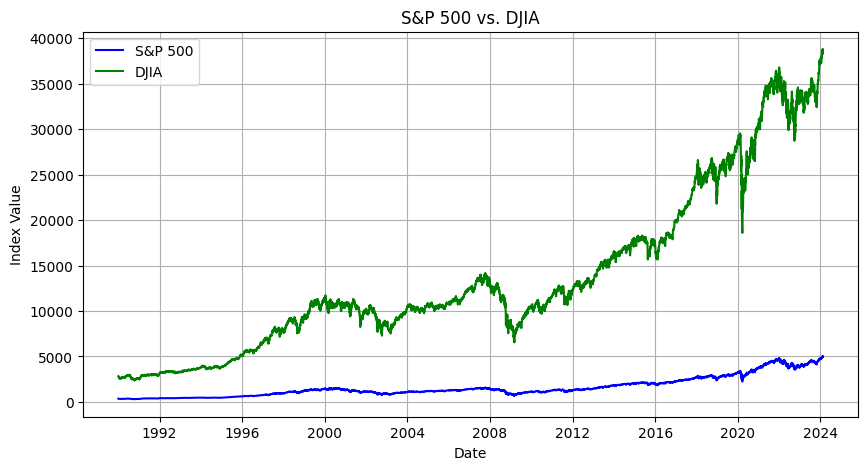

In [8]:
cursor.execute("SELECT dt, sp500, sp500_volume, djia, djia_volume, hsi, vix, us3m, joblessness, epu, GPRD FROM stock_data")
result = cursor.fetchall()
print(tabulate(result, headers=df.columns, tablefmt="grid")) 

plt.figure(figsize=(10, 5))
plt.plot(df['dt'], df['sp500'], label='S&P 500', color='blue')
plt.plot(df['dt'], df['djia'], label='DJIA', color='green')
plt.title("S&P 500 vs. DJIA")
plt.xlabel("Date")
plt.ylabel("Index Value")
plt.legend()
plt.grid()
plt.show()


In [9]:
df2 = pd.read_csv(r"C:\Users\krupa\OneDrive\Desktop\practice\dataset\stock\Eicher_motors_Data_Jan-Nov24.csv")
df2

,Datetime,Open,High,Low,Close,Volume
0,01/01/2024 09:15:00,"4,145.00","4,145.00","4,110.50","4,115.15",10520
1,01/01/2024 09:16:00,"4,110.00","4,122.50","4,106.20","4,116.90",5810
2,01/01/2024 09:17:00,"4,116.80","4,117.25","4,102.95","4,115.80",5664
3,01/01/2024 09:18:00,"4,115.80","4,120.00","4,102.00","4,110.95",7581
4,01/01/2024 09:19:00,"4,110.90","4,116.35","4,103.95","4,106.85",2589
...,...,...,...,...,...,...
84634,29/11/2024 15:25:00,"4,835.00","4,835.00","4,834.95","4,834.95",1473
84635,29/11/2024 15:26:00,"4,835.00","4,835.00","4,834.95","4,835.00",4500
84636,29/11/2024 15:27:00,"4,835.00","4,835.00","4,834.95","4,834.95",2501
84637,29/11/2024 15:28:00,"4,834.95","4,835.00","4,832.15","4,833.15",4959


In [10]:
df2.columns

Index(['Datetime', 'Open', 'High', 'Low', 'Close', 'Volume'], dtype='object')

In [11]:
df2.isnull().sum()

Datetime    0
Open        0
High        0
Low         0
Close       0
Volume      0
dtype: int64

In [12]:
df2.dtypes 

Datetime    object
Open        object
High        object
Low         object
Close       object
Volume       int64
dtype: object

In [ ]:
conn = mysql.connector.connect(host='localhost', username='root', password='mysql', db='mydb')
cursor = conn.cursor()
cursor.execute("SELECT * FROM mydb.")
result = cursor.fetchall()
print(tabulate(result, headers=df2.columns, tablefmt="grid")) 

NameError: name 'mysql' is not defined

In [41]:
df.columns

Index(['dt', 'vix', 'sp500', 'sp500_volume', 'djia', 'djia_volume', 'hsi',
       'ads', 'us3m', 'joblessness', 'epu', 'GPRD', 'prev_day'],
      dtype='object')

In [42]:
df2.columns

Index(['Datetime', 'Open', 'High', 'Low', 'Close', 'Volume'], dtype='object')

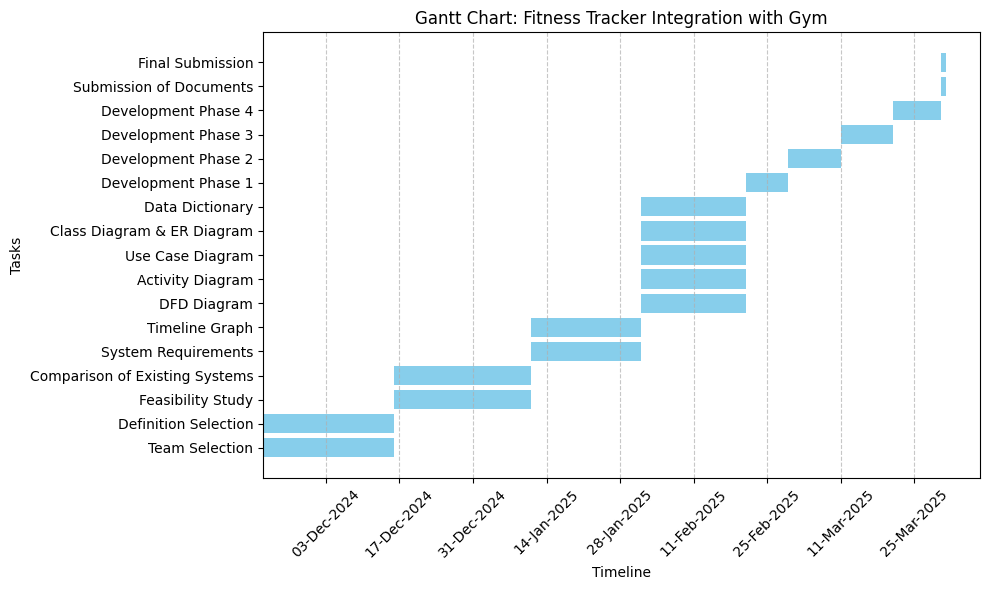

In [1]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime, timedelta

# Define task details and durations for the fitness tracker project
tasks = [
    ("Team Selection", "2024-11-21", "2024-12-15"),
    ("Definition Selection", "2024-11-21", "2024-12-15"),
    ("Feasibility Study", "2024-12-16", "2025-01-10"),
    ("Comparison of Existing Systems", "2024-12-16", "2025-01-10"),
    ("System Requirements", "2025-01-11", "2025-01-31"),
    ("Timeline Graph", "2025-01-11", "2025-01-31"),
    ("DFD Diagram", "2025-02-01", "2025-02-20"),
    ("Activity Diagram", "2025-02-01", "2025-02-20"),
    ("Use Case Diagram", "2025-02-01", "2025-02-20"),
    ("Class Diagram & ER Diagram", "2025-02-01", "2025-02-20"),
    ("Data Dictionary", "2025-02-01", "2025-02-20"),
    ("Development Phase 1", "2025-02-21", "2025-02-28"),
    ("Development Phase 2", "2025-03-01", "2025-03-10"),
    ("Development Phase 3", "2025-03-11", "2025-03-20"),
    ("Development Phase 4", "2025-03-21", "2025-03-29"),
    ("Submission of Documents", "2025-03-30", "2025-03-30"),
    ("Final Submission", "2025-03-30", "2025-03-30"),
]

# Create a figure and axis for the Gantt chart
fig, ax = plt.subplots(figsize=(10, 6))

# Assign each task an index and calculate start/end dates for bars
task_indices = range(len(tasks))
start_dates = [datetime.strptime(task[1], "%Y-%m-%d") for task in tasks]
end_dates = [datetime.strptime(task[2], "%Y-%m-%d") for task in tasks]
durations = [(end - start).days + 1 for start, end in zip(start_dates, end_dates)]

# Plot the tasks as horizontal bars
for i, (task, start, duration) in enumerate(zip(tasks, start_dates, durations)):
    ax.barh(i, duration, left=start, color="skyblue")

# Set task labels on the y-axis
ax.set_yticks(task_indices)
ax.set_yticklabels([task[0] for task in tasks])

# Format the x-axis with date labels
ax.xaxis.set_major_formatter(mdates.DateFormatter("%d-%b-%Y"))
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=2))
plt.xticks(rotation=45)

# Set labels and title
ax.set_xlabel("Timeline")
ax.set_ylabel("Tasks")
ax.set_title("Gantt Chart: Fitness Tracker Integration with Gym")

# Add gridlines for better readability
plt.grid(axis="x", linestyle="--", alpha=0.7)

# Show the Gantt chart
plt.tight_layout()
plt.show()
